In [1]:
import time

from IPython.display import Video, Image, display
import google.auth
import google.auth.transport.requests
import requests
import google.api_core.exceptions

In [2]:
PROJECT_ID = "vertical-video-master"

In [3]:
def send_request_to_google_api(api_endpoint, data=None):
    """
    Sends an HTTP request to a Google API endpoint.

    Args:
        api_endpoint: The URL of the Google API endpoint.
        data: (Optional) Dictionary of data to send in the request body (for POST, PUT, etc.).

    Returns:
        The response from the Google API.
    """

    # Get access token calling API
    creds, project = google.auth.default()
    auth_req = google.auth.transport.requests.Request()
    creds.refresh(auth_req)
    access_token = creds.token

    headers = {
        "Authorization": f"Bearer {access_token}",
        "Content-Type": "application/json",
    }

    response = requests.post(api_endpoint, headers=headers, json=data)
    response.raise_for_status()
    return response.json()


def compose_videogen_request(
    prompt,
    parameters: dict[str, str | int],
    mask_gcs: str = "",
    mask_mime_type: str = "",
    mask_mode: str = "",
    video_gcs: str = "",
):
    instance = {"prompt": prompt}
    if mask_gcs:
        instance["mask"] = {"gcsUri": mask_gcs, "mimeType": mask_mime_type, "maskMode": mask_mode}
    if video_gcs:
        instance["video"] = {"gcsUri": video_gcs, "mimeType": "video/mp4"}
    request = {"instances": [instance], "parameters": parameters}
    return request


def fetch_operation(lro_name):
    request = {"operationName": lro_name}
    for i in range(30):
        resp = send_request_to_google_api(fetch_endpoint, request)
        if "done" in resp and resp["done"]:
            return resp
        time.sleep(10)


def generate_video(
    prompt: str,
    parameters: dict[str, str | int],
    mask_gcs: str = "",
    mask_mime_type: str = "",
    mask_mode: str = "",
    video_gcs: str = "",
):
    req = compose_videogen_request(
        prompt=prompt,
        parameters=parameters,
        mask_gcs=mask_gcs,
        mask_mime_type=mask_mime_type,
        mask_mode=mask_mode,
        video_gcs=video_gcs,
    )
    resp = send_request_to_google_api(prediction_endpoint, req)
    print(resp)
    return fetch_operation(resp["name"])


def show_video(video):
    if "error" in op:
        print("\n" + op["error"]["message"])
        return
    if "videos" in op["response"]:
        for video in op["response"]["videos"]:
            gcs_uri = video["gcsUri"]
            file_name = gcs_uri.split("/")[-1]
            !gsutil cp {gcs_uri} {file_name}
            display(Video(file_name, embed=True, height=400))


def show_video_from_gcs(gcs_uri):
    file_name = gcs_uri.split('/')[-1]
    !gsutil cp {gcs_uri} {file_name}
    display(Video(file_name, embed=True, height=400))


def show_image_from_gcs(image_gcs) -> None:
    file_name = image_gcs.split('/')[-1]
    !gsutil cp {image_gcs} {file_name}
    display(Image(file_name, height=400))

In [4]:
video_model = f"https://us-central1-aiplatform.googleapis.com/v1beta1/projects/{PROJECT_ID}/locations/us-central1/publishers/google/models/veo-2.0-generate-exp"
prediction_endpoint = f"{video_model}:predictLongRunning"
fetch_endpoint = f"{video_model}:fetchPredictOperation"

----Original Video----
Copying gs://veo-assets/outpainting_input/truck.mp4...
/ [1 files][  6.0 MiB/  6.0 MiB]                                                
Operation completed over 1 objects/6.0 MiB.                                      


----Image Mask----
Copying gs://veo-assets/outpainting_input/9x16_mask.png...
/ [1 files][ 11.3 KiB/ 11.3 KiB]                                                
Operation completed over 1 objects/11.3 KiB.                                     


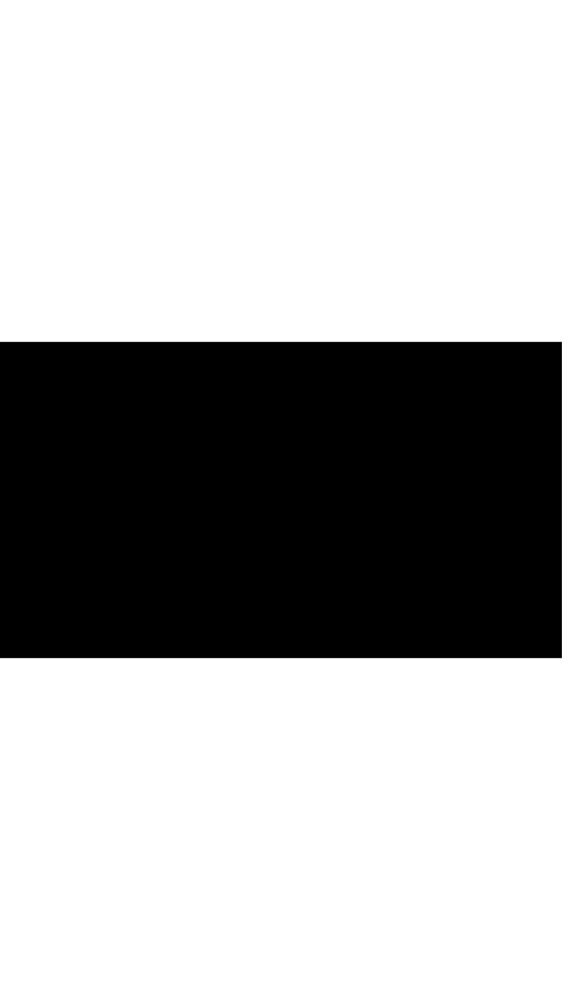

{'name': 'projects/vertical-video-master/locations/us-central1/publishers/google/models/veo-2.0-generate-exp/operations/f8bf0b4c-fb3d-4863-a5c8-bec1f215088e'}
----Edited Video----

Internal error. Please try again later. Operation ID: f8bf0b4c-fb3d-4863-a5c8-bec1f215088e.


In [17]:
# Test 16:9 to 16:9

prompt = "extend the background to show more of the sky and road"  # @param {type: 'string'}
video_gcs= "gs://veo-assets/outpainting_input/truck.mp4" # @param {type: 'string'}
mask_gcs = "gs://veo-assets/outpainting_input/9x16_mask.png" # @param {type: 'string'}
mask_mime_type = "image/png" # @param ["image/png", 'image/jpeg', 'video/mp4']

output_gcs = "gs://veo-assets/outpainting_output"  # @param {type: 'string'}
aspect_ratio = "9:16"  # @param ["16:9", "9:16"]
enhance_prompt = False  # @param {type: 'boolean'}
sample_count = 1 # @param {type: 'number'}
duration = 8 # @param {type: 'number'}

parameters = {
    "storageUri": output_gcs,
    "aspectRatio": aspect_ratio,
    "enhancePrompt": enhance_prompt,
    "sampleCount": sample_count,
    "durationSeconds": duration,
}

print("----Original Video----")
show_video_from_gcs(video_gcs)
print("----Image Mask----")
show_image_from_gcs(mask_gcs)

op = generate_video(
    prompt, video_gcs=video_gcs, mask_gcs=mask_gcs, mask_mime_type=mask_mime_type, mask_mode='OUTPAINT', parameters=parameters
)

print("----Edited Video----")
show_video(op)

In [ ]:
# Test 9:16 to 9:16

prompt = ""  # @param {type: 'string'}
video_gcs= "gs://veo-assets/outpainting_input/man_walking_vert.mp4" # @param {type: 'string'}
mask_gcs = "gs://veo-assets/outpainting_input/9x16_test_mask.png" # @param {type: 'string'}
mask_mime_type = "image/png" # @param ["image/png", 'image/jpeg', 'video/mp4']

output_gcs = "gs://veo-assets/outpainting_output"  # @param {type: 'string'}
aspect_ratio = "9:16"  # @param ["16:9", "9:16"]
enhance_prompt = False  # @param {type: 'boolean'}
sample_count = 1 # @param {type: 'number'}
duration = 8 # @param {type: 'number'}

parameters = {
    "storageUri": output_gcs,
    "aspectRatio": aspect_ratio,
    "enhancePrompt": enhance_prompt,
    "sampleCount": sample_count,
    "durationSeconds": duration,
}

print("----Original Video----")
show_video_from_gcs(video_gcs)
print("----Image Mask----")
show_image_from_gcs(mask_gcs)

op = generate_video(
    prompt, video_gcs=video_gcs, mask_gcs=mask_gcs, mask_mime_type=mask_mime_type, mask_mode='OUTPAINT', parameters=parameters
)

print("----Edited Video----")
show_video(op)

----Original Video----
Copying gs://veo-assets/outpainting_input/man_walking.mp4...
/ [1 files][  4.5 MiB/  4.5 MiB]                                                
Operation completed over 1 objects/4.5 MiB.                                      


----Image Mask----
Copying gs://veo-assets/outpainting_input/9x16_mask.png...
/ [1 files][ 11.3 KiB/ 11.3 KiB]                                                
Operation completed over 1 objects/11.3 KiB.                                     


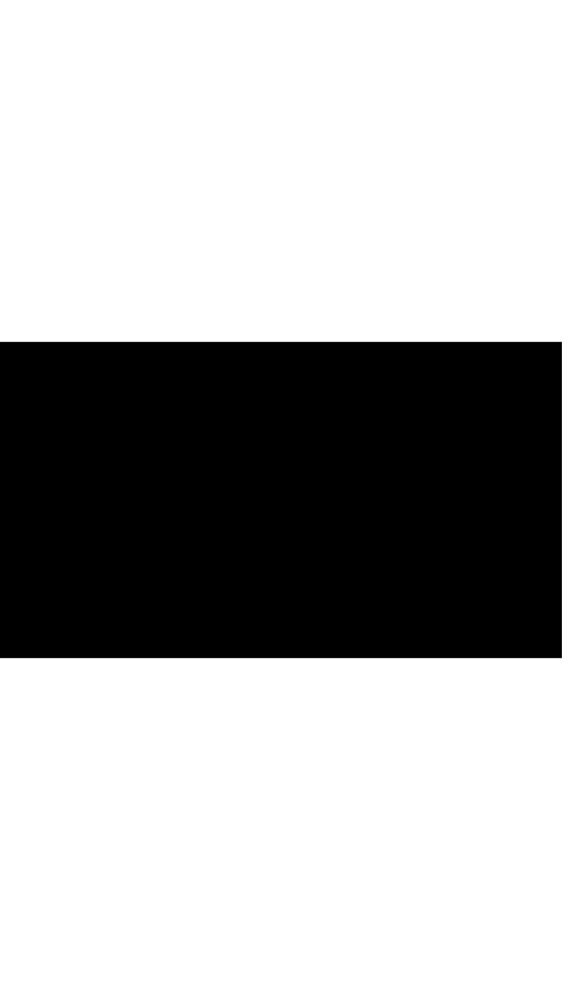


Submitting video generation request...
{'name': 'projects/vertical-video-master/locations/us-central1/publishers/google/models/veo-2.0-generate-exp/operations/4a7c1fd3-a50e-46e0-b4a6-e7eaeea4b5a3'}
Request submitted. Waiting for operation to complete...
----Edited Video----
Copying gs://veo-assets/outpainting_output/12160562514148101767/sample_0.mp4...
/ [1 files][  3.7 MiB/  3.7 MiB]                                                
Operation completed over 1 objects/3.7 MiB.                                      


In [16]:
# Test 16:9 to 9:16 (Verticalization)

prompt = ""  # @param {type: 'string'}
video_gcs= "gs://veo-assets/outpainting_input/man_walking.mp4" # @param {type: 'string'}
mask_gcs = "gs://veo-assets/outpainting_input/9x16_mask.png" # @param {type: 'string'}
mask_mime_type = "image/png" # @param ["image/png", 'image/jpeg', 'video/mp4']

output_gcs = "gs://veo-assets/outpainting_output"  # @param {type: 'string'}
aspect_ratio = "9:16"  # @param ["16:9", "9:16"]
enhance_prompt = False  # @param {type: 'boolean'}
sample_count = 1 # @param {type: 'number'}
duration = 8 # @param {type: 'number'}

parameters = {
    "storageUri": output_gcs,
    "aspectRatio": aspect_ratio,
    "enhancePrompt": enhance_prompt,
    "sampleCount": sample_count,
    "durationSeconds": duration,
}

# --- Display original assets ---
print("----Original Video----")
show_video_from_gcs(video_gcs)
print("----Image Mask----")
show_image_from_gcs(mask_gcs)

# --- Generate video with error handling ---
try:
    print("\nSubmitting video generation request...")
    # This function returns a long-running operation (LRO) object
    op = generate_video(
        prompt, video_gcs=video_gcs, mask_gcs=mask_gcs, mask_mime_type=mask_mime_type, mask_mode='OUTPAINT', parameters=parameters
    )

    print("Request submitted. Waiting for operation to complete...")
    
    # The show_video function likely waits for the operation to finish.
    # If the operation fails, it will raise an exception here.
    print("----Edited Video----")
    show_video(op)

# Catch the specific API error or any other exception
except (google.api_core.exceptions.GoogleAPICallError, Exception) as e:
    print("An error occurred during video generation.")
    print("This is often due to an issue with the API service or invalid input.")
    print("\n==================== ERROR DETAILS ====================")
    print(e)
    print("=====================================================\n")